In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import json
from sklearn.neighbors import NearestNeighbors

In [48]:
df = pd.read_csv('real_estate_prices_avg.csv', keep_default_na=True, delimiter=',', skipinitialspace=True)

In [49]:
# Filter 
df_ny = df[df['StateName'] == 'NY'].copy()
df_ny

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,2000-01-31,...,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31
3,62080,4,11368,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,147948.413848,...,460295.980935,459739.008834,457713.854415,454362.198597,450079.153295,447252.566558,445649.759398,448707.730544,453215.094826,457834.614429
6,62093,7,11385,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,260025.016500,...,792245.946701,790274.222136,789009.516569,787787.018297,787650.013605,786305.427654,786364.639913,789372.263924,794137.400227,797132.864525
8,62019,9,11208,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,179741.485783,...,652637.874178,651937.819925,650807.969671,650281.507987,651886.202439,654315.301070,657543.920241,661994.480483,666260.829997,669321.307626
15,62046,16,11236,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,192186.574856,...,627149.304657,628519.322056,629341.766698,629671.260921,631335.324480,633377.284740,636207.236897,639293.399620,642048.446629,643293.483304
16,61807,17,10467,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Bronx County,134393.861487,...,354373.349988,355271.331503,352488.843458,347554.532379,340937.885522,336545.249023,333051.508054,332609.479710,330210.153467,328464.422738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26286,63115,39992,13435,zip,NY,NY,Prospect,"Utica-Rome, NY",Oneida County,NaN,...,153254.183989,156625.549746,159687.145799,161907.999065,162176.646481,161875.566767,162040.843987,163659.687917,165620.497188,167223.734163
26302,62674,39992,12574,zip,NY,NY,Rhinecliff,"Poughkeepsie-Newburgh-Middletown, NY",Dutchess County,NaN,...,571778.202961,566424.729841,562790.717399,561822.523076,560677.404107,559518.573619,560357.921445,563989.635517,569085.251830,575506.288461
26328,63100,39992,13410,zip,NY,NY,Nelliston,"Amsterdam, NY",Montgomery County,29298.936897,...,116699.303233,118470.278229,120304.260099,122465.877045,124463.935113,125646.714955,125760.526874,125816.270011,126275.795159,127601.305729
26332,63622,39992,14592,zip,NY,NY,York,"Rochester, NY",Livingston County,95552.801539,...,197989.165038,199229.473903,200150.115122,200948.739553,201283.867670,200948.935438,200152.790925,200069.346743,201397.656363,203465.791572


In [50]:
df_ny['RegionName'] = df_ny['RegionName'].astype(str)

In [51]:
nyc_zipcodes = [
    '10001', '10002', '10003', '10004', '10005', '10006', '10007', '10009', '10010', '10011', '10012',
    '10013', '10014', '10016', '10017', '10018', '10019', '10020', '10021', '10022', '10023', '10024',
    '10025', '10026', '10027', '10028', '10029', '10030', '10031', '10032', '10033', '10034', '10035',
    '10036', '10037', '10038', '10039', '10040', '10044', '10045', '10055', '10060', '10065', '10069',
    '10075', '10080', '10103', '10110', '10111', '10112', '10115', '10119', '10128', '10151', '10152',
    '10153', '10154', '10162', '10165', '10167', '10168', '10169', '10170', '10171', '10172', '10173',
    '10174', '10177', '10199', '10271', '10278', '10279', '10280', '10281', '10282', '10301', '10302',
    '10303', '10304', '10305', '10306', '10307', '10308', '10309', '10310', '10311', '10312', '10314',
    '10451', '10452', '10453', '10454', '10455', '10456', '10457', '10458', '10459', '10460', '10461',
    '10462', '10463', '10464', '10465', '10466', '10467', '10468', '10469', '10470', '10471', '10472',
    '10473', '10474', '10475', '11004', '11005', '11101', '11102', '11103', '11104', '11105', '11106',
    '11109', '11201', '11203', '11204', '11205', '11206', '11207', '11208', '11209', '11210', '11211',
    '11212', '11213', '11214', '11215', '11216', '11217', '11218', '11219', '11220', '11221', '11222',
    '11223', '11224', '11225', '11226', '11228', '11229', '11230', '11231', '11232', '11233', '11234',
    '11235', '11236', '11237', '11238', '11239', '11249', '11251', '11354', '11355', '11356', '11357',
    '11358', '11359', '11360', '11361', '11362', '11363', '11364', '11365', '11366', '11367', '11368',
    '11369', '11370', '11372', '11373', '11374', '11375', '11377', '11378', '11379', '11385', '11411',
    '11412', '11413', '11414', '11415', '11416', '11417', '11418', '11419', '11420', '11421', '11422',
    '11423', '11426', '11427', '11428', '11429', '11430', '11432', '11433', '11434', '11435', '11436',
    '11691', '11692', '11693', '11694', '11697'
]

In [52]:
# Filter NYC
df_nyc = df_ny[df_ny['RegionName'].isin(map(str, nyc_zipcodes))]

In [53]:
# Select
date_columns = [col for col in df.columns if '-' in col]
columns_to_keep = ['RegionName'] + date_columns

In [54]:
# Rename 
df_nyc = df_nyc.rename(columns={'RegionName': 'zipcode'})

In [55]:
for col in date_columns:
    df_nyc[col] = pd.to_numeric(df_nyc[col], errors='coerce')

In [56]:
def interpolate_prices(row, max_gap=3):  # max_gap is in months
    prices = row[date_columns].values.astype(float)
    indices = np.arange(len(prices))
    
    # Find gaps
    not_null = ~np.isnan(prices)
    gaps = np.diff(indices[not_null])
    
    # Interpolate only small gaps
    for i in range(len(gaps)):
        if gaps[i] <= max_gap:
            start = indices[not_null][i]
            end = indices[not_null][i+1]
            prices[start:end+1] = np.interp(indices[start:end+1], 
                                            [start, end], 
                                            [prices[start], prices[end]])
    
    return prices

# Apply interpolation to each row
df_nyc[date_columns] = df_nyc.apply(interpolate_prices, axis=1, result_type='expand')

In [57]:
df_nyc.isnull().sum()

RegionID      0
SizeRank      0
zipcode       0
RegionType    0
StateName     0
             ..
2024-01-31    0
2024-02-29    0
2024-03-31    0
2024-04-30    0
2024-05-31    0
Length: 302, dtype: int64

In [58]:
# Prepare data for JSON export
data_by_zipcode = {}
for _, row in df_nyc.iterrows():
    zipcode = row['zipcode']
    prices = row[date_columns].to_dict()
    prices = {k: int(v) if pd.notnull(v) else None for k, v in prices.items()}
    data_by_zipcode[zipcode] = prices

In [59]:
with open('historic_prices_by_zipcode.json', 'w') as f:
    json.dump(data_by_zipcode, f, indent=2)

C:\Users\simon\AppData\Local\Temp\ipykernel_31072\1300999749.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 7))


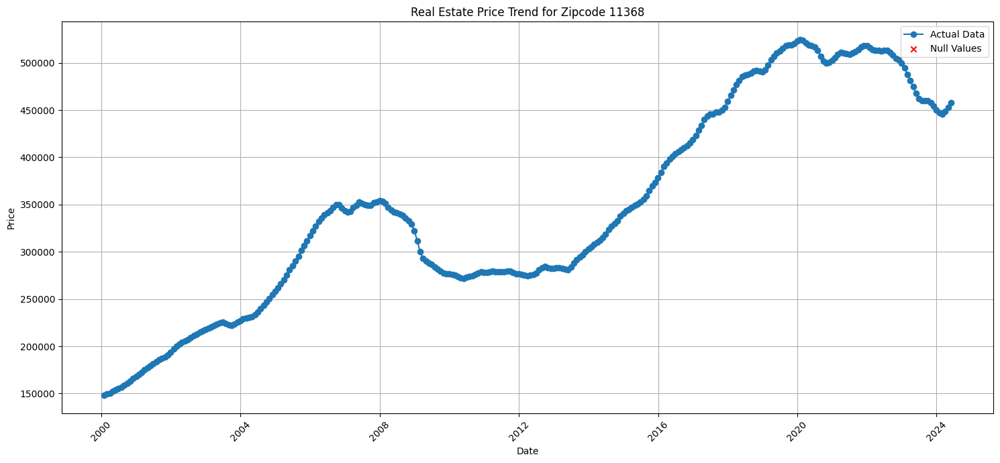

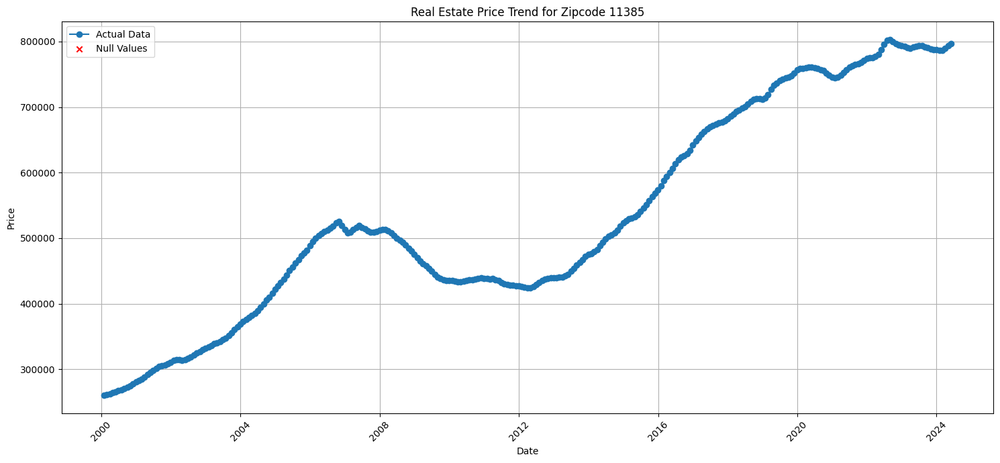

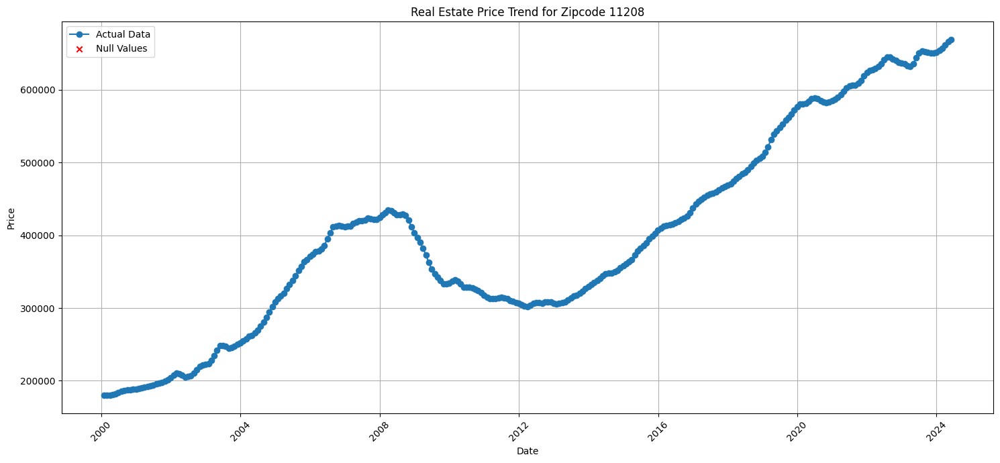

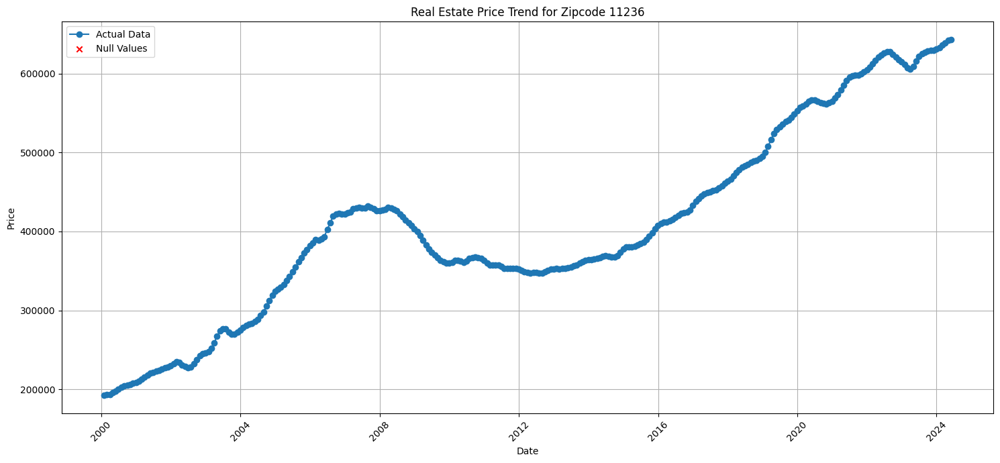

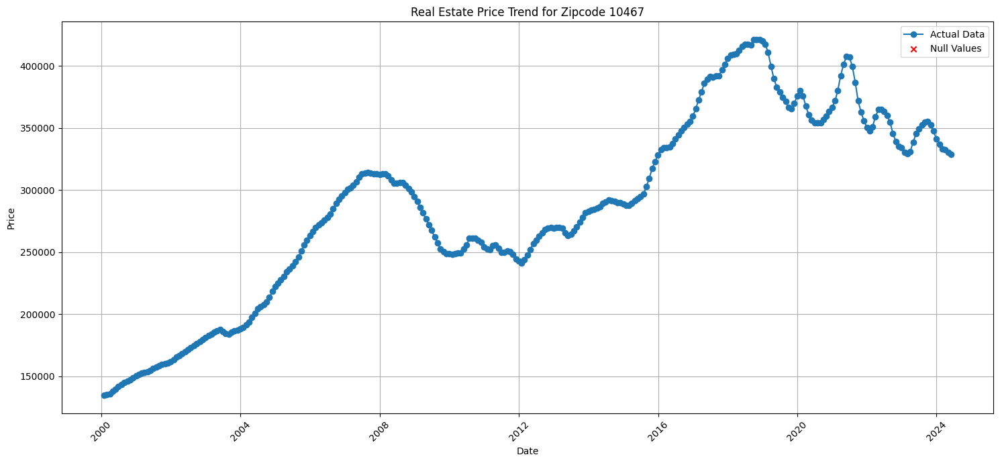

...

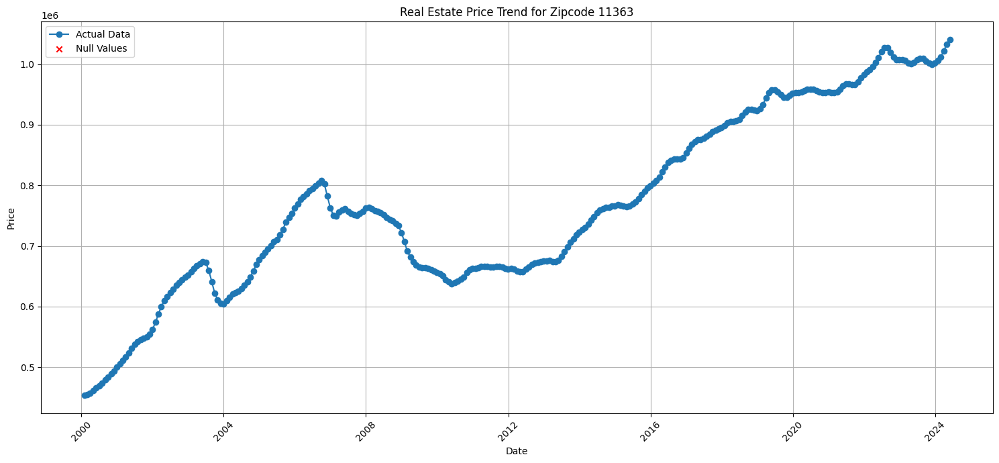

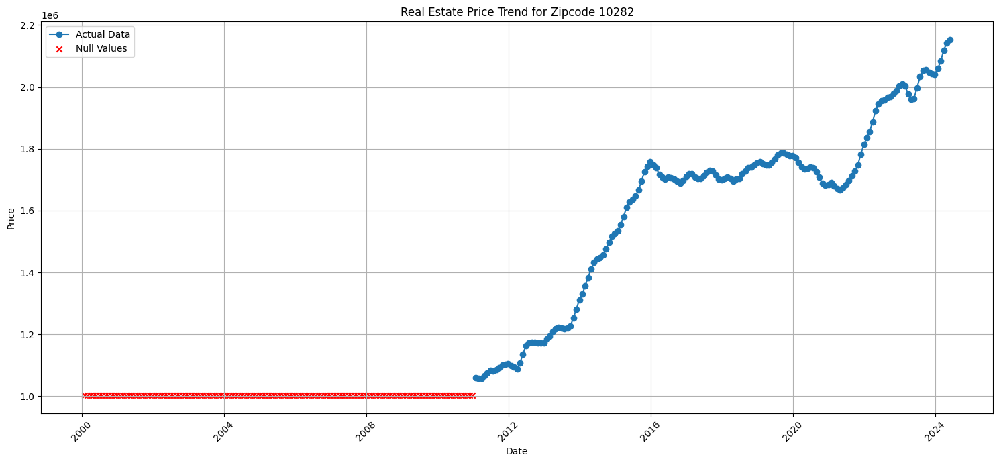

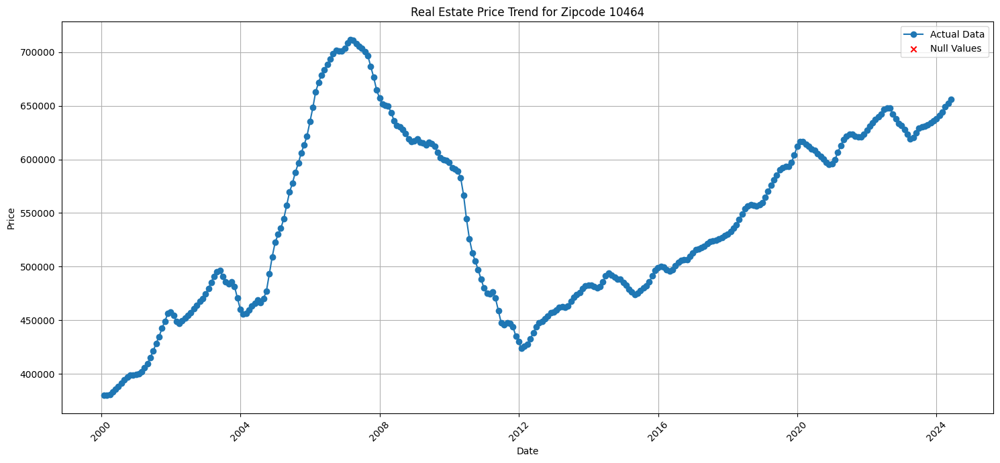

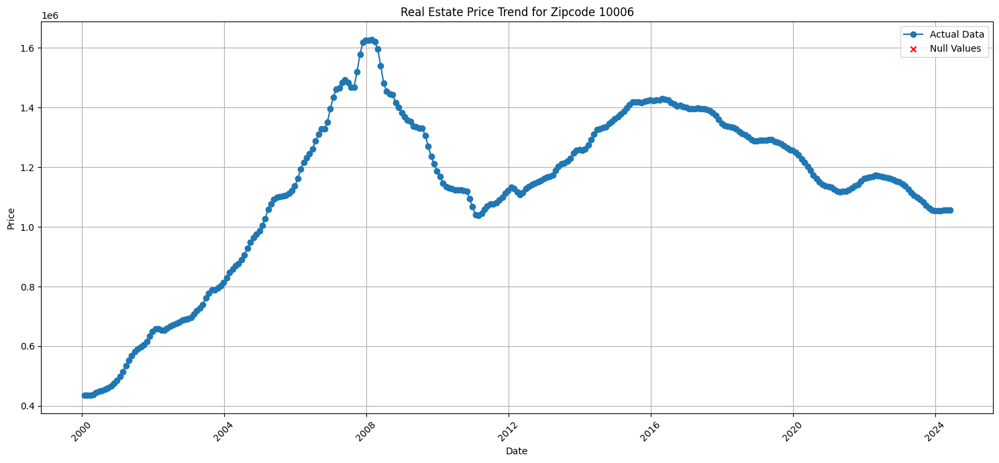

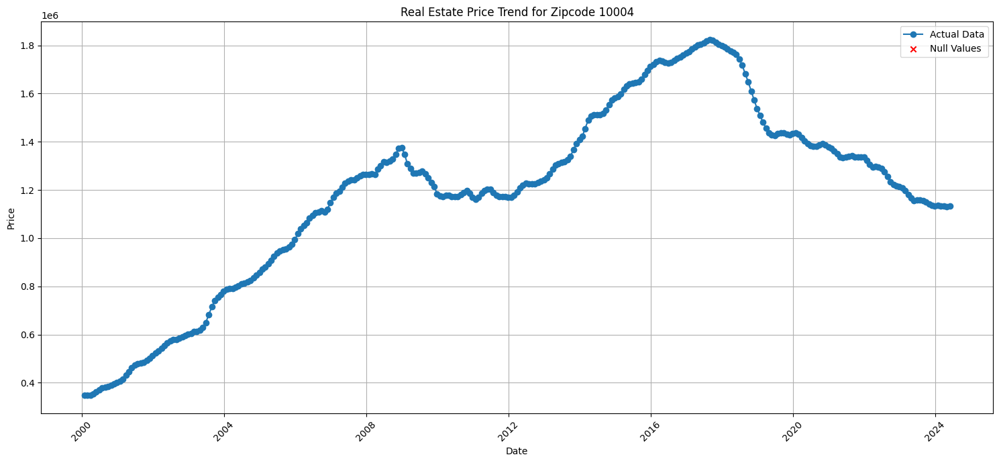

In [60]:
def plot_zipcode(df, zipcode, date_columns, output_dir='zipcode_plots'):
    plt.figure(figsize=(15, 7))
    prices = df[df['zipcode'] == zipcode][date_columns].iloc[0]
    dates = pd.to_datetime(date_columns)
    
    # Plot non-null values
    plt.plot(dates[~prices.isna()], prices[~prices.isna()], marker='o', linestyle='-', label='Actual Data')
    
    # Plot null values
    plt.scatter(dates[prices.isna()], [plt.ylim()[0]] * sum(prices.isna()), color='red', marker='x', label='Null Values')
    
    plt.title(f'Real Estate Price Trend for Zipcode {zipcode}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
for zipcode in df_nyc['zipcode']:
    plot_zipcode(df_nyc, zipcode, date_columns)
